In [1]:
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix

In [17]:
df = pd.read_csv('music_genre.csv')

In [3]:
df.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894.0,Röyksopp,Röyksopp's Night Out,27.0,0.00468,0.652,-1.0,0.941,0.79200,A#,0.115,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652.0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,218293.0,0.890,0.95000,D,0.124,-7.043,Minor,0.0300,115.00200000000001,4-Apr,0.531,Electronic
2,30097.0,Dillon Francis,Hurricane,28.0,0.00306,0.620,215613.0,0.755,0.01180,G#,0.534,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177.0,Dubloadz,Nitro,34.0,0.02540,0.774,166875.0,0.700,0.00253,C#,0.157,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907.0,What So Not,Divide & Conquer,32.0,0.00465,0.638,222369.0,0.587,0.90900,F#,0.157,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 0 to 50004
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist_name       50000 non-null  int64  
 1   popularity        50000 non-null  float64
 2   acousticness      50000 non-null  float64
 3   danceability      50000 non-null  float64
 4   duration_ms       50000 non-null  float64
 5   energy            50000 non-null  float64
 6   instrumentalness  50000 non-null  float64
 7   key               50000 non-null  int64  
 8   liveness          50000 non-null  float64
 9   loudness          50000 non-null  float64
 10  mode              50000 non-null  int64  
 11  speechiness       50000 non-null  float64
 12  tempo             50000 non-null  float64
 13  obtained_date     50000 non-null  int64  
 14  valence           50000 non-null  float64
 15  music_genre       50000 non-null  object 
dtypes: float64(11), int64(4), object(1)
memory us

In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
instance_id,50000.0,55888.396360,20725.256253,20002.000000,37973.5000,55913.500000,73863.250000,91759.000
popularity,50000.0,44.220420,15.542008,0.000000,34.0000,45.000000,56.000000,99.000
acousticness,50000.0,0.306383,0.341340,0.000000,0.0200,0.144000,0.552000,0.996
danceability,50000.0,0.558241,0.178632,0.059600,0.4420,0.568000,0.687000,0.986
duration_ms,50000.0,221252.602860,128671.957157,-1.000000,174800.0000,219281.000000,268612.250000,4830606.000
energy,50000.0,0.599755,0.264559,0.000792,0.4330,0.643000,0.815000,0.999
instrumentalness,50000.0,0.181601,0.325409,0.000000,0.0000,0.000158,0.155000,0.996
liveness,50000.0,0.193896,0.161637,0.009670,0.0969,0.126000,0.244000,1.000
loudness,50000.0,-9.133761,6.162990,-47.046000,-10.8600,-7.276500,-5.173000,3.744
speechiness,50000.0,0.093586,0.101373,0.022300,0.0361,0.048900,0.098525,0.942


In [18]:
df.drop_duplicates(inplace=True)

In [5]:
from ydata_profiling import ProfileReport
rep = ProfileReport(df)
rep

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
%matplotlib inline
df.isnull().sum()

instance_id         1
artist_name         1
track_name          1
popularity          1
acousticness        1
danceability        1
duration_ms         1
energy              1
instrumentalness    1
key                 1
liveness            1
loudness            1
mode                1
speechiness         1
tempo               1
obtained_date       1
valence             1
music_genre         1
dtype: int64

In [19]:
df.dropna(inplace=True)

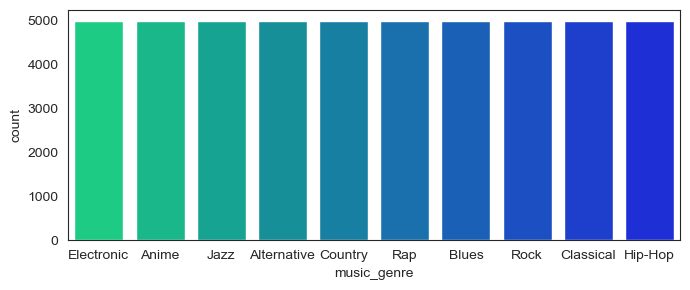

In [62]:
#target column
plt.figure(figsize=(7,3))
sns.set_style('white')
sns.countplot(x='music_genre' ,data=df,palette='winter_r')
plt.tight_layout()

In [25]:
df['music_genre'].nunique()
#there are 10 unique genres with equal number of cases

10

Text(0.5, 1.0, 'Correlational Heatmap')

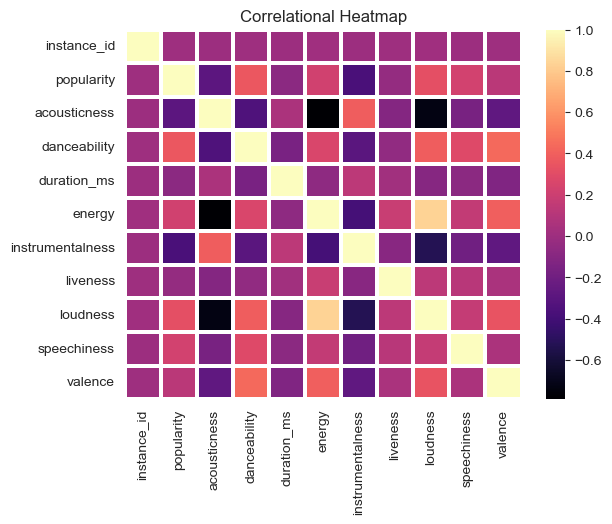

In [76]:
sns.heatmap(df.select_dtypes(include='number').corr(),cmap='magma',linewidths=1.5,linecolor='white')
plt.title('Correlational Heatmap')

# exploring numerical columns

In [45]:
def plot_boxplots(df):
    cols = df.select_dtypes(include='number').columns
    num_plots = len(cols)
    num_rows = (num_plots+1)//2
    fig , axes = plt.subplots(nrows=num_rows,ncols=2,figsize=(15,10))
    for i,column in enumerate(cols):
        col = i %2
        row = i//2
        ax = axes[row,col]
        sns.boxplot(x=df[column],ax=ax)
        ax.set_title(f"Boxplot of {column}")
        ax.set_xlabel(column)
    plt.tight_layout()
    plt.show()
    plt.close()

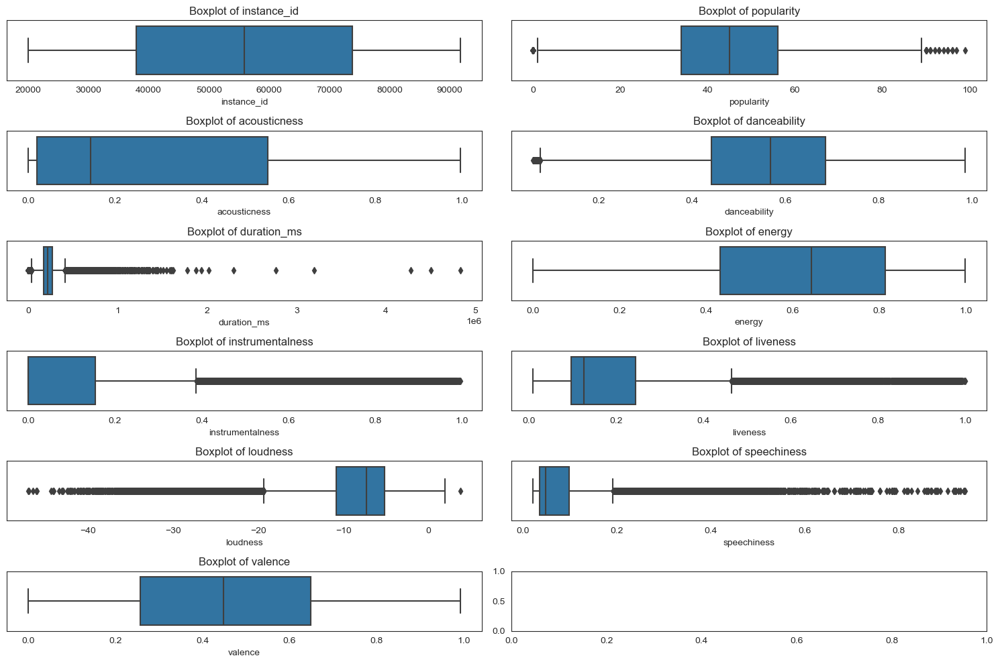

In [46]:
plot_boxplots(df)

In [51]:
def plot_histplots(df):
    cols = df.select_dtypes(include='number').columns
    num_plots = len(cols)
    num_rows = (num_plots+1)//2
    fig , axes = plt.subplots(nrows=num_rows,ncols=2,figsize=(15,20))
    for i,column in enumerate(cols):
        col = i %2
        row = i//2
        ax = axes[row,col]
        sns.histplot(x=df[column],ax=ax,kde=True,bins=60)
        ax.set_title(f"Histplot of {column}")
        ax.set_xlabel(column)
    plt.tight_layout()
    plt.show()
    plt.close()

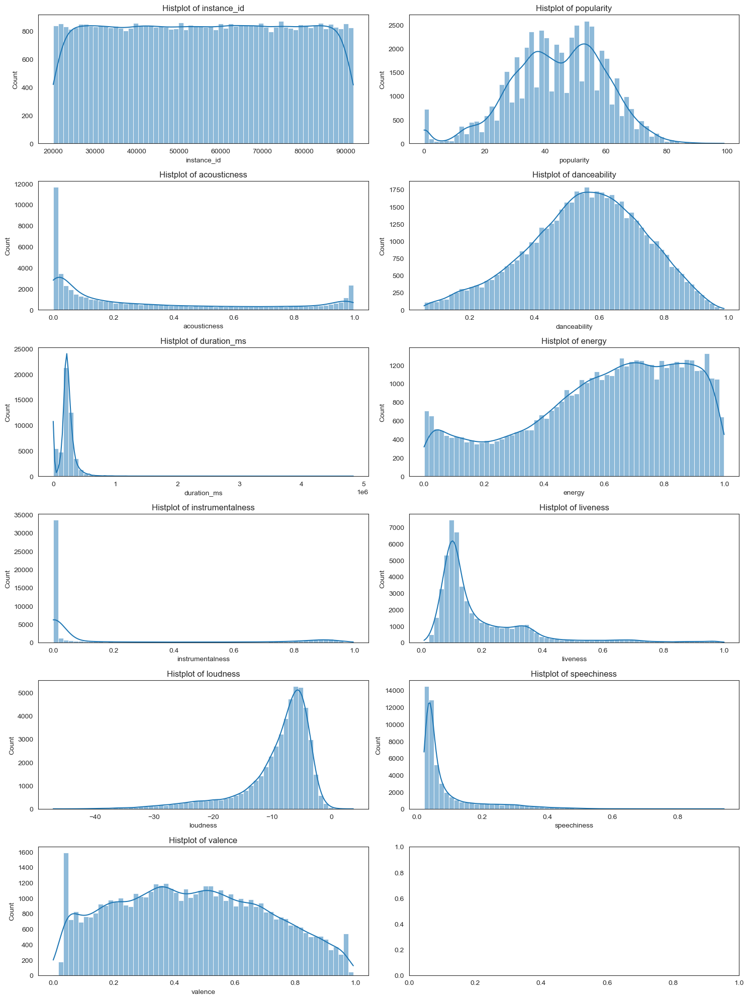

In [52]:
#no extreme outliers in the numerical columns
plot_histplots(df)


# exploring categorical columns

Text(0.5, 1.0, 'Key countplot')

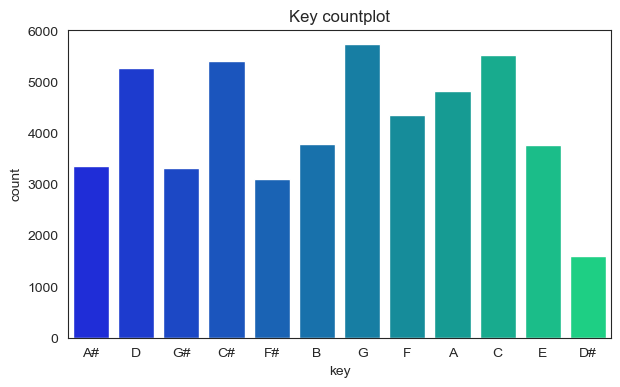

In [72]:
plt.figure(figsize=(7,4))
sns.countplot(x='key',data=df,palette='winter')
plt.title('Key countplot')

<Axes: xlabel='mode', ylabel='count'>

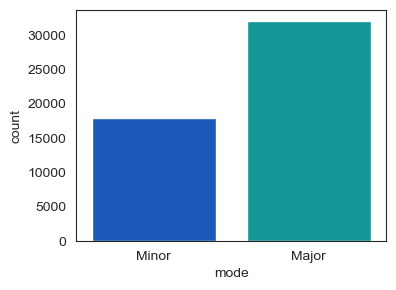

In [77]:
plt.figure(figsize=(4,3))
sns.countplot(x='mode',data=df,palette='winter')

# preprocessing

In [20]:
#dropping instance as its not significant
df = df.drop('instance_id',axis=1)

In [21]:
#artist_name
df['artist_name'].nunique()

6863

In [22]:
#label encoding artist names
from sklearn.preprocessing import LabelEncoder
lbl_en = LabelEncoder()
df['artist_name'] = lbl_en.fit_transform(df['artist_name'])

In [81]:
df['track_name'].nunique()

41699

In [23]:
#there are a lot of unique track names thus it cant be label encoded and converting using nlp is not computationally worth it
#thus we'll be dropping the track_list
df = df.drop('track_name',axis=1)

In [24]:
#encoding key column
df['key'] = lbl_en.fit_transform(df['key'])

In [25]:
#encoding mode column
df['mode'] = lbl_en.fit_transform(df['mode'])

In [26]:
# tempo column is an object where it should be float
rep_map = {'?':0.00}
df['tempo'] = df['tempo'].replace(rep_map)

In [27]:
df['tempo'] = df['tempo'].apply(lambda x : float(x))

In [95]:
df['tempo'].dtype

dtype('float64')

In [97]:
df['obtained_date'].value_counts()

obtained_date
4-Apr    44748
3-Apr     4067
5-Apr      784
1-Apr      400
0/4          1
Name: count, dtype: int64

In [28]:
date_map = {'4-Apr':4,'3-Apr':3,'5-Apr':5,'1-Apr':1,'0/4':0}
df['obtained_date'] = df['obtained_date'].replace(date_map)

# splitting and scaling

In [ ]:
"""
models:
1.DTREE +RANDCV
2.RFC + randcv
3.svm+ randcv
4.lgreg + randcv
5.knn
6.catboost
7.xgboost
8.ANN
"""

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X = df.drop('music_genre', axis=1).values
y = df['music_genre'].values  # Ensuring y is properly accessed

# Splitting data into train, test, and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train)

# Standardizing features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)  # Using the same scaler instance for validation set
X_test = scaler.transform(X_test)  

In [43]:
from sklearn.preprocessing import LabelEncoder
lbl_en = LabelEncoder()
df['music_genre'] = lbl_en.fit_transform(df['music_genre'])

In [107]:
#dtree model 
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)
print("DTREE")
print('\n')
print(confusion_matrix(y_test,pred_dtree))
print('\n')
print(classification_report(y_test,pred_dtree))

DTREE


[[ 465   45   81   33  211  115  125   99   99  227]
 [  30  996  153  100   46  110    1   49    4   11]
 [  80  134  667   54  125  162    6  208    9   55]
 [  23  104   66 1120   14   41    0  123    2    7]
 [ 192   49  141   18  656   53   42  103   40  206]
 [ 136   87  171   43   43  713   33  218   22   34]
 [ 124    5    5    1   27   34  537   23  668   76]
 [ 101   50  232   91   86  226   43  607   21   43]
 [ 121    6    9    0   53   19  738   18  398  138]
 [ 273   11   57    7  242   44   85   42  132  607]]


              precision    recall  f1-score   support

 Alternative       0.30      0.31      0.31      1500
       Anime       0.67      0.66      0.67      1500
       Blues       0.42      0.44      0.43      1500
   Classical       0.76      0.75      0.75      1500
     Country       0.44      0.44      0.44      1500
  Electronic       0.47      0.48      0.47      1500
     Hip-Hop       0.33      0.36      0.35      1500
        Jazz       0.41   

In [109]:
#hypertuning
from sklearn.model_selection import RandomizedSearchCV
# Define the hyperparameter grid for RandomizedSearchCV
random_param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': np.arange(3, 15),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 6),
    'max_features': ['sqrt', 'log2', None]
}
rand_grid = RandomizedSearchCV(dtree,random_param_grid,n_iter=75,verbose=3,)
rand_grid.fit(X_train,y_train)

Fitting 5 folds for each of 75 candidates, totalling 375 fits
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.503 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.495 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.499 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.498 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.495 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.444 total time=   0.1s
[CV 2/5] END criteri

[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.466 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.462 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.475 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.479 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.335 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.356 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_sam

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.378 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.290 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.291 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.305 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.328 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.323 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, 

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.424 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.416 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.388 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.398 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.328 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.258 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.341 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.341 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.327 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.321 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.379 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.476 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=5, sp

[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.397 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.368 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.414 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.281 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.294 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.327 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.487 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.263 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.377 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.324 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3

RandomizedSearchCV(estimator=DecisionTreeClassifier(), n_iter=75,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': array([1, 2, 3, 4, 5]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'splitter': ['best', 'random']},
                   verbose=3)

In [110]:
pred_rand_dtree = rand_grid.predict(X_test)
print(classification_report(y_test,pred_rand_dtree))

              precision    recall  f1-score   support

 Alternative       0.37      0.36      0.37      1500
       Anime       0.76      0.63      0.69      1500
       Blues       0.53      0.46      0.49      1500
   Classical       0.83      0.77      0.80      1500
     Country       0.48      0.46      0.47      1500
  Electronic       0.54      0.47      0.50      1500
     Hip-Hop       0.42      0.25      0.31      1500
        Jazz       0.43      0.47      0.45      1500
         Rap       0.42      0.58      0.49      1500
        Rock       0.47      0.73      0.58      1500

    accuracy                           0.52     15000
   macro avg       0.53      0.52      0.51     15000
weighted avg       0.53      0.52      0.51     15000



In [111]:
#RFC
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print("RFC")
print('\n')
print(confusion_matrix(y_test,pred_rfc))
print('\n')
print(classification_report(y_test,pred_rfc))

RFC


[[ 558   20   52    5  186   63  132   96   69  319]
 [  40 1137   80  107   41   65    0   19    2    9]
 [  62  106  844   23  110   95    6  177    0   77]
 [  38   39   38 1259    7   32    0   82    0    5]
 [ 100   27   78    1  868   24   24   74   30  274]
 [  97   61  102   13   35  927   24  179   16   46]
 [  78    0    0    0   17    6  549   14  771   65]
 [  44   16  194   89   67  214   32  770   18   56]
 [  65    1    4    0   24    5  752    7  482  160]
 [ 200    7   26    2  139   14   38   25   86  963]]


              precision    recall  f1-score   support

 Alternative       0.44      0.37      0.40      1500
       Anime       0.80      0.76      0.78      1500
       Blues       0.60      0.56      0.58      1500
   Classical       0.84      0.84      0.84      1500
     Country       0.58      0.58      0.58      1500
  Electronic       0.64      0.62      0.63      1500
     Hip-Hop       0.35      0.37      0.36      1500
        Jazz       0.53     

In [112]:
#hypertuning
from sklearn.model_selection import RandomizedSearchCV
random_grid ={'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
rfc_random.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END bootstrap=True, max_depth=40, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=  20.2s
[CV] END bootstrap=False, max_depth=90, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=  16.7s
[CV] END bootstrap=True, max_depth=60, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time= 1.0min


/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV] END bootstrap=True, max_depth=40, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=  20.1s
[CV] END bootstrap=False, max_depth=90, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=  16.8s
[CV] END bootstrap=True, max_depth=60, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time= 1.0min
[CV] END bootstrap=True, max_depth=40, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=  20.0s
[CV] END bootstrap=False, max_depth=90, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=  16.7s
[CV] END bootstrap=True, max_depth=60, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time= 1.0min
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=  52.0s
[CV] END bootstrap=True, max_depth=50, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=  55.8s
[CV] END bootstrap=True, max_depth=10, min_samples_l

[CV] END bootstrap=True, max_depth=90, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=  20.9s
[CV] END bootstrap=False, max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=  10.8s
[CV] END bootstrap=True, max_depth=70, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time= 1.9min
[CV] END bootstrap=False, max_depth=50, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time= 2.9min
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=  51.9s
[CV] END bootstrap=True, max_depth=60, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=  35.7s
[CV] END bootstrap=False, max_depth=60, min_samples_leaf=4, min_samples_split=10, n_estimators=800; total time= 1.0min
[CV] END bootstrap=True, max_depth=70, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time= 1.8min
[CV] END bootstrap=True, max_depth=90, min_samples_

[CV] END bootstrap=False, max_depth=80, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time= 1.2min
[CV] END bootstrap=False, max_depth=100, min_samples_leaf=2, min_samples_split=5, n_estimators=2000; total time= 3.0min
[CV] END bootstrap=True, max_depth=40, min_samples_leaf=1, min_samples_split=2, n_estimators=1200; total time= 1.2min
[CV] END bootstrap=False, max_depth=80, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time= 1.2min
[CV] END bootstrap=False, max_depth=100, min_samples_leaf=2, min_samples_split=5, n_estimators=2000; total time= 3.0min
[CV] END bootstrap=True, max_depth=90, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  10.5s
[CV] END bootstrap=True, max_depth=70, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=  11.3s
[CV] END bootstrap=False, max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1200; total time= 1.1min
[CV] END bootstrap=False, max_depth=50, min_samples_l

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [114]:
pred_rfc_random = rfc_random.predict(X_test)
print(classification_report(y_test,pred_rfc_random))

              precision    recall  f1-score   support

 Alternative       0.49      0.36      0.42      1500
       Anime       0.80      0.74      0.77      1500
       Blues       0.63      0.56      0.59      1500
   Classical       0.84      0.84      0.84      1500
     Country       0.59      0.59      0.59      1500
  Electronic       0.64      0.62      0.63      1500
     Hip-Hop       0.36      0.38      0.37      1500
        Jazz       0.53      0.53      0.53      1500
         Rap       0.35      0.34      0.34      1500
        Rock       0.51      0.74      0.60      1500

    accuracy                           0.57     15000
   macro avg       0.57      0.57      0.57     15000
weighted avg       0.57      0.57      0.57     15000

[CV] END bootstrap=False, max_depth=40, min_samples_leaf=2, min_samples_split=10, n_estimators=1800; total time= 2.5min
[CV] END bootstrap=False, max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=  30.9s
[C

[CV] END bootstrap=False, max_depth=50, min_samples_leaf=4, min_samples_split=2, n_estimators=1800; total time= 2.4min
[CV] END bootstrap=False, max_depth=90, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time= 1.7min
[CV] END bootstrap=True, max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=  10.5s
[CV] END bootstrap=True, max_depth=100, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time= 1.9min
[CV] END bootstrap=True, max_depth=70, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=  11.2s
[CV] END bootstrap=False, max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1200; total time= 1.1min
[CV] END bootstrap=False, max_depth=50, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time= 2.1min
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=2000; total time= 1.9min
[CV] END bootstrap=False, max_depth=50, min_samples_

# catboost

In [7]:
df = pd.read_csv('music_genre.csv')

In [8]:
df.drop_duplicates(inplace=True)
df.dropna(inplace=True)

In [11]:
df['music_genre'] = lbl_en.fit_transform(df['music_genre'])

In [12]:
X = df.drop('music_genre',axis=1)
y = df['music_genre']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.25,random_state=42)

In [14]:
categorical_features_indices = np.where(X.dtypes!='float')[0]
#modified for multiclass
parameters = {
    'iterations': 1000,                
    'learning_rate': 0.025,               
    'depth': 15,                         
    'l2_leaf_reg': 7,                   
    'bagging_temperature': 1.5,         
    'border_count': 254,                
    'thread_count': 24,                  
    'random_seed': 42,                  
    'loss_function': 'MultiClass',      # Change to MultiClass for multi-class classification
    'eval_metric': 'MultiClass',        # Change to MultiClass for multi-class classification
    'custom_metric': ['Accuracy'],      # Remove 'AUC' from custom metrics since AUC is not applicable for multi-class
    'use_best_model': True,            
    'od_type': 'Iter',                  
    'verbose': True              
}


In [15]:
#catboost can handle categorical features well so we wont be transforming them
from catboost import CatBoostClassifier,metrics,Pool
model = CatBoostClassifier(
    **parameters,
)
model.fit(
    X_train, y_train,
    cat_features=categorical_features_indices,
    eval_set=(X_val, y_val),
    logging_level='Verbose',  
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

TBB Warning: The number of workers is currently limited to 11. The request for 23 workers is ignored. Further requests for more workers will be silently ignored until the limit changes.



0:	learn: 2.2294089	test: 2.2226852	best: 2.2226852 (0)	total: 5.73s	remaining: 1h 35m 24s
1:	learn: 2.1472932	test: 2.1294563	best: 2.1294563 (1)	total: 9.85s	remaining: 1h 21m 56s
2:	learn: 2.0697252	test: 2.0400530	best: 2.0400530 (2)	total: 13.9s	remaining: 1h 16m 57s
3:	learn: 2.0159885	test: 1.9809198	best: 1.9809198 (3)	total: 19.5s	remaining: 1h 20m 47s
4:	learn: 1.9573874	test: 1.9162279	best: 1.9162279 (4)	total: 24.7s	remaining: 1h 21m 48s
5:	learn: 1.9082534	test: 1.8635557	best: 1.8635557 (5)	total: 29.4s	remaining: 1h 21m 8s
6:	learn: 1.8635960	test: 1.8136763	best: 1.8136763 (6)	total: 33.7s	remaining: 1h 19m 37s
7:	learn: 1.8174899	test: 1.7625782	best: 1.7625782 (7)	total: 37.9s	remaining: 1h 18m 14s
8:	learn: 1.7716274	test: 1.7114213	best: 1.7114213 (8)	total: 43.2s	remaining: 1h 19m 16s
9:	learn: 1.7343353	test: 1.6724931	best: 1.6724931 (9)	total: 47.3s	remaining: 1h 18m 5s
10:	learn: 1.6912598	test: 1.6239500	best: 1.6239500 (10)	total: 47.6s	remaining: 1h 11m 22s

88:	learn: 0.8819111	test: 0.8086575	best: 0.8086575 (88)	total: 6m 56s	remaining: 1h 11m 1s
89:	learn: 0.8783889	test: 0.8058113	best: 0.8058113 (89)	total: 7m	remaining: 1h 10m 56s
90:	learn: 0.8744021	test: 0.8023423	best: 0.8023423 (90)	total: 7m 5s	remaining: 1h 10m 47s
91:	learn: 0.8714988	test: 0.8000934	best: 0.8000934 (91)	total: 7m 9s	remaining: 1h 10m 41s
92:	learn: 0.8691291	test: 0.7982413	best: 0.7982413 (92)	total: 7m 14s	remaining: 1h 10m 39s
93:	learn: 0.8666943	test: 0.7967637	best: 0.7967637 (93)	total: 7m 20s	remaining: 1h 10m 41s
94:	learn: 0.8633746	test: 0.7940425	best: 0.7940425 (94)	total: 7m 24s	remaining: 1h 10m 38s
95:	learn: 0.8602432	test: 0.7915402	best: 0.7915402 (95)	total: 7m 29s	remaining: 1h 10m 35s
96:	learn: 0.8579521	test: 0.7901165	best: 0.7901165 (96)	total: 7m 34s	remaining: 1h 10m 27s
97:	learn: 0.8547765	test: 0.7873083	best: 0.7873083 (97)	total: 7m 39s	remaining: 1h 10m 26s
98:	learn: 0.8526546	test: 0.7862266	best: 0.7862266 (98)	total: 7m

175:	learn: 0.6988979	test: 0.6842082	best: 0.6842082 (175)	total: 13m 52s	remaining: 1h 4m 56s
176:	learn: 0.6974314	test: 0.6833804	best: 0.6833804 (176)	total: 13m 57s	remaining: 1h 4m 55s
177:	learn: 0.6960031	test: 0.6825746	best: 0.6825746 (177)	total: 14m 3s	remaining: 1h 4m 54s
178:	learn: 0.6943885	test: 0.6816113	best: 0.6816113 (178)	total: 14m 8s	remaining: 1h 4m 50s
179:	learn: 0.6928460	test: 0.6806536	best: 0.6806536 (179)	total: 14m 13s	remaining: 1h 4m 47s
180:	learn: 0.6915725	test: 0.6802067	best: 0.6802067 (180)	total: 14m 18s	remaining: 1h 4m 46s
181:	learn: 0.6898863	test: 0.6792525	best: 0.6792525 (181)	total: 14m 23s	remaining: 1h 4m 39s
182:	learn: 0.6887224	test: 0.6789292	best: 0.6789292 (182)	total: 14m 29s	remaining: 1h 4m 40s
183:	learn: 0.6875421	test: 0.6784245	best: 0.6784245 (183)	total: 14m 34s	remaining: 1h 4m 38s
184:	learn: 0.6861241	test: 0.6777560	best: 0.6777560 (184)	total: 14m 39s	remaining: 1h 4m 35s
185:	learn: 0.6848763	test: 0.6773276	best

261:	learn: 0.5978842	test: 0.6392734	best: 0.6392734 (261)	total: 21m 22s	remaining: 1h 12s
262:	learn: 0.5968393	test: 0.6387162	best: 0.6387162 (262)	total: 21m 27s	remaining: 1h 8s
263:	learn: 0.5959389	test: 0.6385169	best: 0.6385169 (263)	total: 21m 32s	remaining: 1h 2s
264:	learn: 0.5949797	test: 0.6382830	best: 0.6382830 (264)	total: 21m 37s	remaining: 59m 57s
265:	learn: 0.5940007	test: 0.6380240	best: 0.6380240 (265)	total: 21m 41s	remaining: 59m 51s
266:	learn: 0.5931225	test: 0.6377356	best: 0.6377356 (266)	total: 21m 46s	remaining: 59m 46s
267:	learn: 0.5922360	test: 0.6376629	best: 0.6376629 (267)	total: 21m 51s	remaining: 59m 43s
268:	learn: 0.5913579	test: 0.6375771	best: 0.6375771 (268)	total: 21m 57s	remaining: 59m 40s
269:	learn: 0.5904105	test: 0.6371872	best: 0.6371872 (269)	total: 22m 2s	remaining: 59m 34s
270:	learn: 0.5894908	test: 0.6368005	best: 0.6368005 (270)	total: 22m 6s	remaining: 59m 29s
271:	learn: 0.5885417	test: 0.6364935	best: 0.6364935 (271)	total: 

349:	learn: 0.5148591	test: 0.5935977	best: 0.5935977 (349)	total: 29m 16s	remaining: 54m 22s
350:	learn: 0.5139914	test: 0.5931650	best: 0.5931650 (350)	total: 29m 22s	remaining: 54m 17s
351:	learn: 0.5131787	test: 0.5927430	best: 0.5927430 (351)	total: 29m 27s	remaining: 54m 13s
352:	learn: 0.5124038	test: 0.5923484	best: 0.5923484 (352)	total: 29m 32s	remaining: 54m 8s
353:	learn: 0.5117039	test: 0.5920322	best: 0.5920322 (353)	total: 29m 37s	remaining: 54m 4s
354:	learn: 0.5108797	test: 0.5916229	best: 0.5916229 (354)	total: 29m 43s	remaining: 53m 59s
355:	learn: 0.5101739	test: 0.5913430	best: 0.5913430 (355)	total: 29m 48s	remaining: 53m 55s
356:	learn: 0.5093438	test: 0.5906512	best: 0.5906512 (356)	total: 29m 54s	remaining: 53m 51s
357:	learn: 0.5083935	test: 0.5899629	best: 0.5899629 (357)	total: 29m 58s	remaining: 53m 44s
358:	learn: 0.5076331	test: 0.5896559	best: 0.5896559 (358)	total: 30m 3s	remaining: 53m 40s
359:	learn: 0.5068493	test: 0.5892509	best: 0.5892509 (359)	tot

437:	learn: 0.4521425	test: 0.5602780	best: 0.5602780 (437)	total: 36m 46s	remaining: 47m 10s
438:	learn: 0.4515585	test: 0.5601230	best: 0.5601230 (438)	total: 36m 51s	remaining: 47m 6s
439:	learn: 0.4509187	test: 0.5597589	best: 0.5597589 (439)	total: 36m 56s	remaining: 47m 1s
440:	learn: 0.4503359	test: 0.5594282	best: 0.5594282 (440)	total: 37m 2s	remaining: 46m 56s
441:	learn: 0.4497543	test: 0.5591165	best: 0.5591165 (441)	total: 37m 6s	remaining: 46m 51s
442:	learn: 0.4492259	test: 0.5587774	best: 0.5587774 (442)	total: 37m 11s	remaining: 46m 45s
443:	learn: 0.4486063	test: 0.5584366	best: 0.5584366 (443)	total: 37m 16s	remaining: 46m 40s
444:	learn: 0.4479057	test: 0.5579796	best: 0.5579796 (444)	total: 37m 20s	remaining: 46m 34s
445:	learn: 0.4473577	test: 0.5578662	best: 0.5578662 (445)	total: 37m 25s	remaining: 46m 29s
446:	learn: 0.4467383	test: 0.5575645	best: 0.5575645 (446)	total: 37m 30s	remaining: 46m 23s
447:	learn: 0.4459830	test: 0.5570006	best: 0.5570006 (447)	tota

525:	learn: 0.4027576	test: 0.5420171	best: 0.5420171 (525)	total: 43m 50s	remaining: 39m 30s
526:	learn: 0.4022273	test: 0.5418525	best: 0.5418525 (526)	total: 43m 55s	remaining: 39m 25s
527:	learn: 0.4017498	test: 0.5416155	best: 0.5416155 (527)	total: 43m 59s	remaining: 39m 19s
528:	learn: 0.4012258	test: 0.5415355	best: 0.5415355 (528)	total: 44m 5s	remaining: 39m 15s
529:	learn: 0.4007254	test: 0.5413821	best: 0.5413821 (529)	total: 44m 9s	remaining: 39m 9s
530:	learn: 0.4002476	test: 0.5412661	best: 0.5412661 (530)	total: 44m 14s	remaining: 39m 4s
531:	learn: 0.3997324	test: 0.5411252	best: 0.5411252 (531)	total: 44m 19s	remaining: 38m 59s
532:	learn: 0.3992410	test: 0.5410053	best: 0.5410053 (532)	total: 44m 23s	remaining: 38m 54s
533:	learn: 0.3987540	test: 0.5407972	best: 0.5407972 (533)	total: 44m 28s	remaining: 38m 48s
534:	learn: 0.3982921	test: 0.5407456	best: 0.5407456 (534)	total: 44m 33s	remaining: 38m 43s
535:	learn: 0.3978373	test: 0.5405202	best: 0.5405202 (535)	tota

613:	learn: 0.3617348	test: 0.5302102	best: 0.5302102 (613)	total: 51m 3s	remaining: 32m 6s
614:	learn: 0.3613565	test: 0.5300709	best: 0.5300709 (614)	total: 51m 8s	remaining: 32m 1s
615:	learn: 0.3609162	test: 0.5299510	best: 0.5299510 (615)	total: 51m 13s	remaining: 31m 55s
616:	learn: 0.3604719	test: 0.5298759	best: 0.5298759 (616)	total: 51m 18s	remaining: 31m 50s
617:	learn: 0.3600447	test: 0.5297644	best: 0.5297644 (617)	total: 51m 23s	remaining: 31m 46s
618:	learn: 0.3596607	test: 0.5296689	best: 0.5296689 (618)	total: 51m 28s	remaining: 31m 41s
619:	learn: 0.3591976	test: 0.5295466	best: 0.5295466 (619)	total: 51m 33s	remaining: 31m 36s
620:	learn: 0.3587501	test: 0.5294888	best: 0.5294888 (620)	total: 51m 40s	remaining: 31m 31s
621:	learn: 0.3583335	test: 0.5293622	best: 0.5293622 (621)	total: 51m 45s	remaining: 31m 27s
622:	learn: 0.3579043	test: 0.5292813	best: 0.5292813 (622)	total: 51m 50s	remaining: 31m 22s
623:	learn: 0.3574731	test: 0.5291954	best: 0.5291954 (623)	tota

701:	learn: 0.3265199	test: 0.5209253	best: 0.5209253 (701)	total: 58m 30s	remaining: 24m 50s
702:	learn: 0.3261465	test: 0.5208206	best: 0.5208206 (702)	total: 58m 35s	remaining: 24m 45s
703:	learn: 0.3257542	test: 0.5207640	best: 0.5207640 (703)	total: 58m 40s	remaining: 24m 40s
704:	learn: 0.3254230	test: 0.5206378	best: 0.5206378 (704)	total: 58m 46s	remaining: 24m 35s
705:	learn: 0.3250424	test: 0.5206009	best: 0.5206009 (705)	total: 58m 51s	remaining: 24m 30s
706:	learn: 0.3246843	test: 0.5205013	best: 0.5205013 (706)	total: 58m 56s	remaining: 24m 25s
707:	learn: 0.3243146	test: 0.5204242	best: 0.5204242 (707)	total: 59m	remaining: 24m 20s
708:	learn: 0.3239712	test: 0.5203039	best: 0.5203039 (708)	total: 59m 5s	remaining: 24m 15s
709:	learn: 0.3236152	test: 0.5202527	best: 0.5202527 (709)	total: 59m 10s	remaining: 24m 10s
710:	learn: 0.3232681	test: 0.5201938	best: 0.5201938 (710)	total: 59m 15s	remaining: 24m 5s
711:	learn: 0.3229092	test: 0.5200746	best: 0.5200746 (711)	total:

788:	learn: 0.2967010	test: 0.5131804	best: 0.5131804 (788)	total: 1h 5m 55s	remaining: 17m 37s
789:	learn: 0.2963527	test: 0.5130131	best: 0.5130131 (789)	total: 1h 6m	remaining: 17m 32s
790:	learn: 0.2960364	test: 0.5129441	best: 0.5129441 (790)	total: 1h 6m 5s	remaining: 17m 27s
791:	learn: 0.2957098	test: 0.5128749	best: 0.5128749 (791)	total: 1h 6m 10s	remaining: 17m 22s
792:	learn: 0.2953945	test: 0.5128096	best: 0.5128096 (792)	total: 1h 6m 14s	remaining: 17m 17s
793:	learn: 0.2950861	test: 0.5127487	best: 0.5127487 (793)	total: 1h 6m 20s	remaining: 17m 12s
794:	learn: 0.2947307	test: 0.5126668	best: 0.5126668 (794)	total: 1h 6m 25s	remaining: 17m 7s
795:	learn: 0.2944330	test: 0.5126311	best: 0.5126311 (795)	total: 1h 6m 30s	remaining: 17m 2s
796:	learn: 0.2941367	test: 0.5125301	best: 0.5125301 (796)	total: 1h 6m 37s	remaining: 16m 58s
797:	learn: 0.2937794	test: 0.5125372	best: 0.5125301 (796)	total: 1h 6m 43s	remaining: 16m 53s
798:	learn: 0.2934109	test: 0.5124988	best: 0.5

874:	learn: 0.2702214	test: 0.5070253	best: 0.5070253 (874)	total: 1h 13m 25s	remaining: 10m 29s
875:	learn: 0.2699323	test: 0.5069687	best: 0.5069687 (875)	total: 1h 13m 31s	remaining: 10m 24s
876:	learn: 0.2696669	test: 0.5069210	best: 0.5069210 (876)	total: 1h 13m 35s	remaining: 10m 19s
877:	learn: 0.2694224	test: 0.5068541	best: 0.5068541 (877)	total: 1h 13m 40s	remaining: 10m 14s
878:	learn: 0.2691280	test: 0.5068123	best: 0.5068123 (878)	total: 1h 13m 46s	remaining: 10m 9s
879:	learn: 0.2688290	test: 0.5067549	best: 0.5067549 (879)	total: 1h 13m 52s	remaining: 10m 4s
880:	learn: 0.2685592	test: 0.5067365	best: 0.5067365 (880)	total: 1h 13m 57s	remaining: 9m 59s
881:	learn: 0.2683021	test: 0.5065615	best: 0.5065615 (881)	total: 1h 14m 2s	remaining: 9m 54s
882:	learn: 0.2680245	test: 0.5064914	best: 0.5064914 (882)	total: 1h 14m 7s	remaining: 9m 49s
883:	learn: 0.2677486	test: 0.5064421	best: 0.5064421 (883)	total: 1h 14m 12s	remaining: 9m 44s
884:	learn: 0.2674697	test: 0.5064232	

960:	learn: 0.2473161	test: 0.5019223	best: 0.5019223 (960)	total: 1h 22m 42s	remaining: 3m 21s
961:	learn: 0.2470803	test: 0.5018361	best: 0.5018361 (961)	total: 1h 22m 47s	remaining: 3m 16s
962:	learn: 0.2468137	test: 0.5017599	best: 0.5017599 (962)	total: 1h 22m 52s	remaining: 3m 11s
963:	learn: 0.2465546	test: 0.5017056	best: 0.5017056 (963)	total: 1h 22m 58s	remaining: 3m 5s
964:	learn: 0.2463122	test: 0.5015737	best: 0.5015737 (964)	total: 1h 23m 3s	remaining: 3m
965:	learn: 0.2460708	test: 0.5015850	best: 0.5015737 (964)	total: 1h 23m 8s	remaining: 2m 55s
966:	learn: 0.2458109	test: 0.5015527	best: 0.5015527 (966)	total: 1h 23m 14s	remaining: 2m 50s
967:	learn: 0.2455655	test: 0.5014934	best: 0.5014934 (967)	total: 1h 23m 19s	remaining: 2m 45s
968:	learn: 0.2453349	test: 0.5013761	best: 0.5013761 (968)	total: 1h 23m 25s	remaining: 2m 40s
969:	learn: 0.2450682	test: 0.5013603	best: 0.5013603 (969)	total: 1h 23m 32s	remaining: 2m 35s
970:	learn: 0.2448255	test: 0.5013413	best: 0.5

In [16]:
pred_cat = model.predict(X_test)
print(classification_report(y_test,pred_cat))

              precision    recall  f1-score   support

           0       0.70      0.75      0.72      1498
           1       0.96      0.97      0.96      1529
           2       0.88      0.85      0.87      1545
           3       0.95      0.94      0.95      1479
           4       0.84      0.88      0.86      1481
           5       0.91      0.93      0.91      1535
           6       0.64      0.68      0.66      1492
           7       0.83      0.82      0.82      1483
           8       0.67      0.58      0.62      1492
           9       0.75      0.73      0.74      1466

    accuracy                           0.81     15000
   macro avg       0.81      0.81      0.81     15000
weighted avg       0.81      0.81      0.81     15000



# Deep Learning

In [47]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
from keras.utils import to_categorical

# Define your model
model = Sequential()
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(2, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(10, activation='softmax'))  # Adjusted to num_classes
model.compile(optimizer='adam', loss='categorical_crossentropy')

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=20)

# Train the model
model.fit(X_train, y_train, epochs=500, validation_data=(X_val, y_val), callbacks=[early_stopping], verbose=1)


Epoch 1/500


ValueError: in user code:

    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/losses.py", line 2221, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "/Users/aadityajoshi/anaconda3/lib/python3.11/site-packages/keras/src/backend.py", line 5573, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 1) and (None, 10) are incompatible
